In [1]:
import os
import copy

import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sklearn
from sklearn.manifold import TSNE

In [2]:
import phate

In [3]:
os.chdir('..')
import manifold_methods
import plotting
import mappings
import data_loader

In [4]:
# Load HGDP
exp_path = '/lustre06/project/6065672/shared/DietNet/1KGB_POP24/HGDP_sub/'
fname = 'gnomad.genomes.v3.1.2.hgdp_tgp.PASSfiltered.newIDs.onlySNPs.noDuplicatePos.noMiss5perc.match1000G_GSAs_dietnet.hdf5'
metadata_file = 'labels.tsv'
unrelated_sampleid_1000G_path = '/lustre06/project/6065672/grenier2/DietNet/Generalisation/datasets_112023/HGDP_1KGP/1000G_unrelated_samples_set_2504.txt'
data_path = os.path.join(exp_path, fname)
metadata_path = os.path.join(exp_path, metadata_file)

inputs, class_labels, sample, snp_names, class_label_names, metadata_labels = data_loader.load_data_HDGP(data_path, metadata_path, unrelated_sampleid_1000G_path)

Removed 701 related individuals


In [5]:
#np.save('inputs_hgdp', inputs)
#metadata_labels.to_csv('metadata_labels_hgdp')
#pd.DataFrame(sample).to_csv('samples')

In [6]:
def make_palette_label_order_HGDP(metadata_labels):
    # SAS -> CSA + add MID, OCE
    pop_palette_hgdp_coarse = copy.deepcopy(mappings.pop_pallette_1000G_coarse)
    pop_palette_hgdp_coarse['CSA'] = mappings.pop_pallette_1000G_coarse['SAS']
    pop_palette_hgdp_coarse.pop('SAS')

    pop_palette_hgdp_coarse['MID'] = 'grey'
    pop_palette_hgdp_coarse['OCE'] = 'yellow'

    label_order_hgdp_coarse = copy.deepcopy(mappings.label_order_1000G_coarse)
    label_order_hgdp_coarse.remove('SAS')
    label_order_hgdp_coarse += ['CSA', 'MID', 'OCE']

    # Keep original 24/26 populations (with colors), and add new ones. New pops colored using superpop
    label_order_hgdp_fine = []
    for super_pop in np.unique(metadata_labels['Superpopulation']):
        for pop in np.unique(metadata_labels['Population'][metadata_labels['Superpopulation']==super_pop]):
            label_order_hgdp_fine.append(pop)

    # create tmp object to hold the original 26 populations
    mapping_26 = copy.deepcopy(mappings.pop_pallette_1000G_fine)
    mapping_26['GBR'] = mapping_26['CEUGBR']
    mapping_26['CEU'] = mapping_26['CEUGBR']
    mapping_26['STU'] = mapping_26['STUITU']
    mapping_26['ITU'] = mapping_26['STUITU']

    pop_palette_hgdp_fine = {}

    for super_pop in np.unique(metadata_labels['Superpopulation']):
        for pop in np.unique(metadata_labels['Population'][metadata_labels['Superpopulation']==super_pop]):
            if pop not in mapping_26.keys():
                # just use superpop color for now
                pop_palette_hgdp_fine[pop] = pop_palette_hgdp_coarse[super_pop]
            else:
                pop_palette_hgdp_fine[pop] = mapping_26[pop]

    return pop_palette_hgdp_coarse, pop_palette_hgdp_fine, label_order_hgdp_coarse, label_order_hgdp_fine

In [7]:
pop_palette_hgdp_coarse, pop_palette_hgdp_fine, label_order_hgdp_coarse, label_order_hgdp_fine = make_palette_label_order_HGDP(metadata_labels)

## Make PCA, PHATE, t-SNE

In [8]:
pca_obj = sklearn.decomposition.PCA(n_components=100, random_state=42)
pca_input = pca_obj.fit_transform(inputs)

In [9]:
# initial phate embedding
phate_operator = phate.PHATE(random_state=42, knn=5, t=10, n_pca=None)
phate_operator.fit(pca_input)
phate_emb = phate_operator.transform()

Running PHATE on 3449 observations and 100 variables.
Calculating graph and diffusion operator...
  Calculating KNN search...
  Calculated KNN search in 0.80 seconds.
  Calculating affinities...
  Calculated affinities in 0.08 seconds.
Calculated graph and diffusion operator in 0.92 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 0.18 seconds.
  Calculating KMeans...
  Calculated KMeans in 3.41 seconds.
Calculated landmark operator in 4.23 seconds.
Calculating diffusion potential...
Calculated diffusion potential in 1.20 seconds.
Calculating metric MDS...
Calculated metric MDS in 3.81 seconds.


In [10]:
# t-SNE embedding
tsne_obj = TSNE(perplexity=30.0, early_exaggeration=4.0, learning_rate=1000)
tsne_emb = tsne_obj.fit_transform(pca_input)

## Visualizations

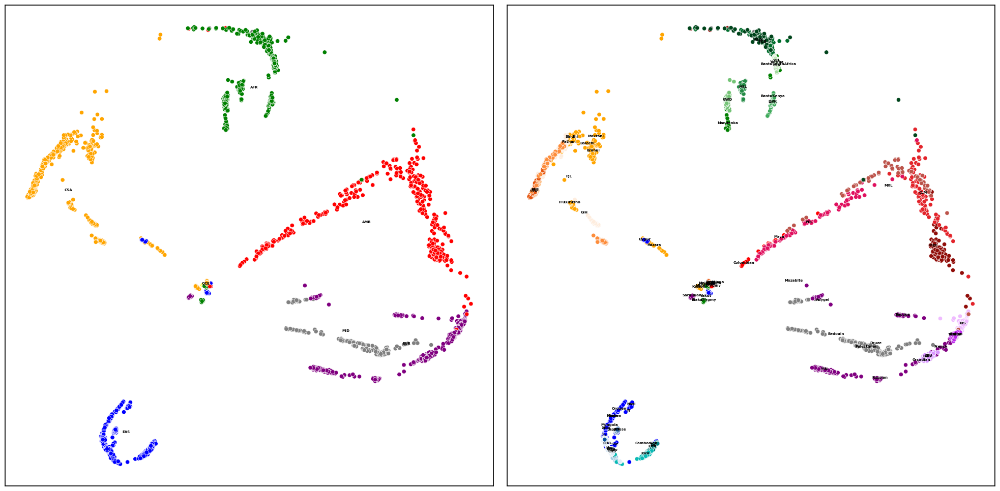

In [11]:
fig, ax = plt.subplots(ncols=2, figsize=(20,10))

plotting.plot_embeddings(phate_emb, 
                         metadata_labels['Superpopulation'].values, 
                         None,
                         pop_palette_hgdp_coarse,
                         label_order_hgdp_coarse,
                         True,
                         ax[0])
plotting.plot_embeddings(phate_emb, 
                         metadata_labels['Population'].values, 
                         None,
                         pop_palette_hgdp_fine,
                         label_order_hgdp_fine,
                         True,
                         ax[1])
plt.tight_layout()

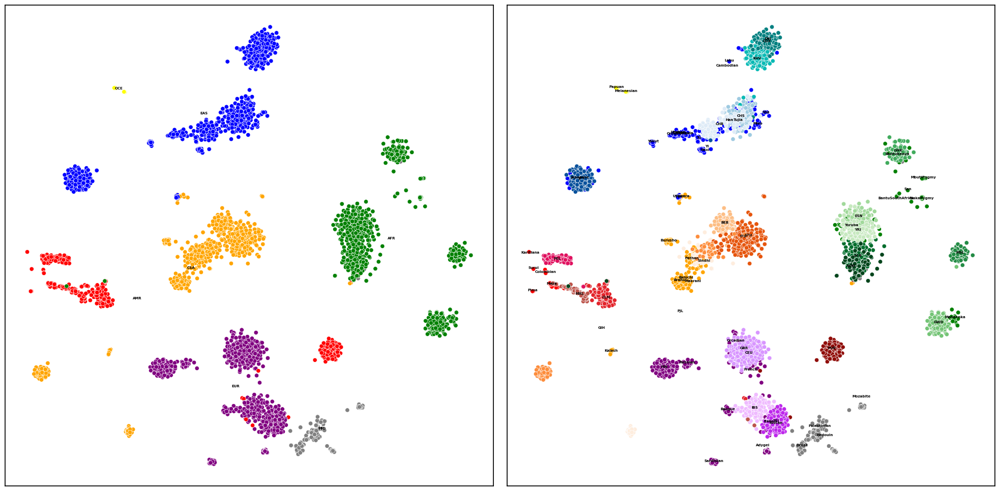

In [12]:
fig, ax = plt.subplots(ncols=2, figsize=(20,10))

plotting.plot_embeddings(tsne_emb, 
                         metadata_labels['Superpopulation'].values, 
                         None,
                         pop_palette_hgdp_coarse,
                         label_order_hgdp_coarse,
                         True,
                         ax[0])
plotting.plot_embeddings(tsne_emb, 
                         metadata_labels['Population'].values, 
                         None,
                         pop_palette_hgdp_fine,
                         label_order_hgdp_fine,
                         True,
                         ax[1])
plt.tight_layout()

Look at seperated points

In [13]:
from sklearn.cluster import DBSCAN
dbscan_obj = DBSCAN(eps=0.001)
dbscan_preds = dbscan_obj.fit_predict(phate_emb)

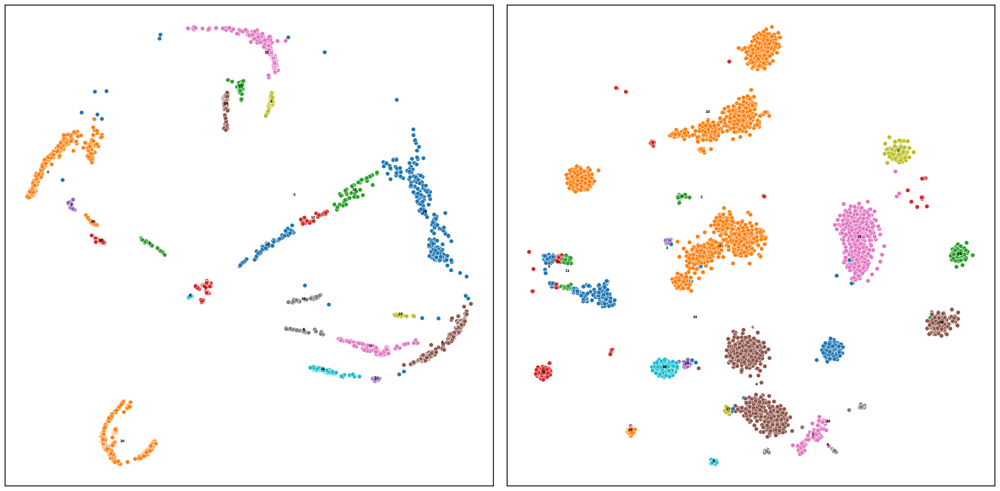

In [14]:
fig, ax = plt.subplots(ncols=2, figsize=(20,10))

plotting.plot_embeddings(phate_emb, 
                         dbscan_preds.tolist(), 
                         None,
                         None,
                         None,
                         True,
                         ax[0])
plotting.plot_embeddings(tsne_emb, 
                         dbscan_preds.tolist(), 
                         None,
                         None,
                         None,
                         True,
                         ax[1])
plt.tight_layout()

In [15]:
clusters_of_interest = np.zeros(len(dbscan_preds), dtype=int)
clusters_of_interest[dbscan_preds == 2] = 2
clusters_of_interest[dbscan_preds == 8] = 8

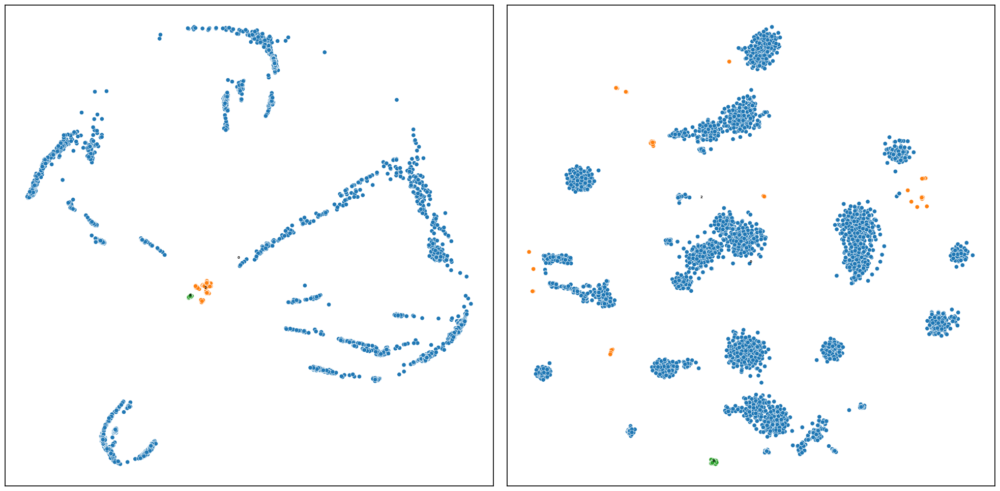

In [16]:
fig, ax = plt.subplots(ncols=2, figsize=(20,10))
plotting.plot_embeddings(phate_emb, 
                         clusters_of_interest.tolist(), 
                         None,
                         None,
                         None,
                         True,
                         ax[0])
plotting.plot_embeddings(tsne_emb, 
                         clusters_of_interest.tolist(), 
                         None,
                         None,
                         None,
                         True,
                         ax[1])
plt.tight_layout()

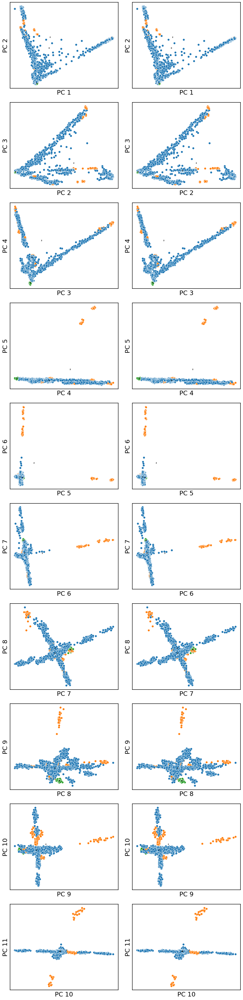

In [17]:
fig, ax = plt.subplots(nrows=10, ncols=2, figsize=(10,40))
for comp in range(10):
    # initial 2D phate embedding
    plotting.plot_embeddings(pca_input[:,comp:(comp+2)], 
                             clusters_of_interest.tolist(), 
                             None,
                             None,
                             None,
                             True,
                             ax[comp, 0])
    plotting.plot_embeddings(pca_input[:,comp:(comp+2)], 
                             clusters_of_interest.tolist(), 
                             None,
                             None,
                             None,
                             True,
                             ax[comp, 1])
    #ax[comp, 0].get_legend().remove()
    #ax[comp, 1].get_legend().remove()
    ax[comp, 0].set_xlabel('PC {}'.format(comp+1))
    ax[comp, 0].set_ylabel('PC {}'.format(comp+2))
    ax[comp, 1].set_xlabel('PC {}'.format(comp+1))
    ax[comp, 1].set_ylabel('PC {}'.format(comp+2))
plt.tight_layout()
fig.savefig('figures/PCA_1000G+HGDP')

## Check Enrichment

In [18]:
metadata_labels['DBSCAN_clusters'] = clusters_of_interest

In [19]:
metadata_dbscan_cluster_2_or_8 = metadata_labels[metadata_labels['DBSCAN_clusters'] != 0]

In [20]:
metadata_dbscan_cluster_2_or_8.groupby([ 'DBSCAN_clusters', 'Superpopulation'])['db'].count()

DBSCAN_clusters  Superpopulation
2                AFR                46
                 AMR                33
                 CSA                39
                 EAS                32
                 OCE                30
8                EUR                27
Name: db, dtype: int64

In [21]:
metadata_dbscan_cluster_2_or_8.groupby(['DBSCAN_clusters', 'Population'])['db'].count()

DBSCAN_clusters  Population
2                BiakaPygmy    26
                 ITU           16
                 Kalash        23
                 Karitiana     11
                 Lahu           8
                 MbutiPygmy    14
                 Melanesian    13
                 Papuan        17
                 Pima          14
                 San            6
                 Surui          8
                 Yakut         24
8                Sardinian     27
Name: db, dtype: int64

In [22]:
metadata_dbscan_cluster_2_or_8.groupby(['DBSCAN_clusters', 'db'], observed=False)['db'].count()

DBSCAN_clusters  db   
2                1000G     16
                 HGDP     164
8                1000G      0
                 HGDP      27
Name: db, dtype: int64

In [23]:
prop_df = metadata_dbscan_cluster_2_or_8.groupby(['DBSCAN_clusters', 'Population'])['db'].count().reset_index()
total_counts = metadata_labels.groupby('Population').count().reset_index().set_index('Population').loc[prop_df['Population']]['Superpopulation']

In [24]:
prop_df['prop'] = prop_df['db'].values / total_counts.values

In [25]:
prop_df

,DBSCAN_clusters,Population,db,prop
0,2,BiakaPygmy,26,1.000000
1,2,ITU,16,0.156863
2,2,Kalash,23,1.000000
3,2,Karitiana,11,0.916667
4,2,Lahu,8,1.000000
5,2,MbutiPygmy,14,1.000000
6,2,Melanesian,13,1.000000
7,2,Papuan,17,1.000000
8,2,Pima,14,1.000000
9,2,San,6,1.000000


In [26]:
np.array(metadata_labels[(metadata_labels['DBSCAN_clusters'] == 2)].index.tolist())

array(['HGDP00274', 'HGDP00277', 'HGDP00279', 'HGDP00281', 'HGDP00285',
       'HGDP00288', 'HGDP00290', 'HGDP00298', 'HGDP00302', 'HGDP00304',
       'HGDP00307', 'HGDP00309', 'HGDP00311', 'HGDP00313', 'HGDP00315',
       'HGDP00319', 'HGDP00321', 'HGDP00323', 'HGDP00326', 'HGDP00330',
       'HGDP00333', 'HGDP00450', 'HGDP00452', 'HGDP00453', 'HGDP00454',
       'HGDP00455', 'HGDP00458', 'HGDP00459', 'HGDP00460', 'HGDP00462',
       'HGDP00463', 'HGDP00464', 'HGDP00465', 'HGDP00466', 'HGDP00467',
       'HGDP00468', 'HGDP00469', 'HGDP00470', 'HGDP00471', 'HGDP00472',
       'HGDP00473', 'HGDP00475', 'HGDP00478', 'HGDP00479', 'HGDP00490',
       'HGDP00491', 'HGDP00540', 'HGDP00541', 'HGDP00542', 'HGDP00543',
       'HGDP00544', 'HGDP00545', 'HGDP00546', 'HGDP00547', 'HGDP00549',
       'HGDP00550', 'HGDP00551', 'HGDP00553', 'HGDP00555', 'HGDP00556',
       'HGDP00655', 'HGDP00661', 'HGDP00662', 'HGDP00663', 'HGDP00664',
       'HGDP00787', 'HGDP00788', 'HGDP00823', 'HGDP00832', 'HGDP

In [27]:
np.array(metadata_labels[(metadata_labels['DBSCAN_clusters'] == 8)].index.tolist())

array(['HGDP00666', 'HGDP00667', 'HGDP00668', 'HGDP00669', 'HGDP00670',
       'HGDP00671', 'HGDP00672', 'HGDP00673', 'HGDP00674', 'HGDP01062',
       'HGDP01063', 'HGDP01064', 'HGDP01065', 'HGDP01066', 'HGDP01067',
       'HGDP01068', 'HGDP01069', 'HGDP01070', 'HGDP01071', 'HGDP01072',
       'HGDP01073', 'HGDP01074', 'HGDP01075', 'HGDP01077',
       'LP6005441-DNA_C11', 'LP6005441-DNA_D11', 'SS6004474'],
      dtype='<U17')

In [28]:
# get Karitiana and Yakut that are not in cluster 2
metadata_labels[(metadata_labels['Population']=='Yakut') & (metadata_labels['DBSCAN_clusters'] != 2)]

,Population,Superpopulation,db,DBSCAN_clusters
sample,,,,
HGDP00959,Yakut,EAS,HGDP,0


In [29]:
metadata_labels[(metadata_labels['Population']=='Karitiana') & (metadata_labels['DBSCAN_clusters'] != 2)]

,Population,Superpopulation,db,DBSCAN_clusters
sample,,,,
HGDP01009,Karitiana,AMR,HGDP,0


## Color by populations from 2 and 8

In [30]:
metadata_labels['DBSCAN+Pop'] = metadata_labels['Population']

In [31]:
metadata_labels.loc[metadata_labels['DBSCAN_clusters'] == 0, 'DBSCAN+Pop'] = 'Not Outlier'

In [32]:
label_order_hgdp_outliers = []
for x in label_order_hgdp_fine:
    if (x in np.unique(metadata_labels['DBSCAN+Pop'])) and (x != 'Not Outlier'):
        label_order_hgdp_outliers.append(x)
label_order_hgdp_outliers.append('Not Outlier')

In [33]:
pop_palette_hgdp_outliers = {'Not Outlier': 'grey'}
for x in label_order_hgdp_outliers:
    if x != 'Not Outlier':
        pop_palette_hgdp_outliers[x] = pop_palette_hgdp_fine[x]

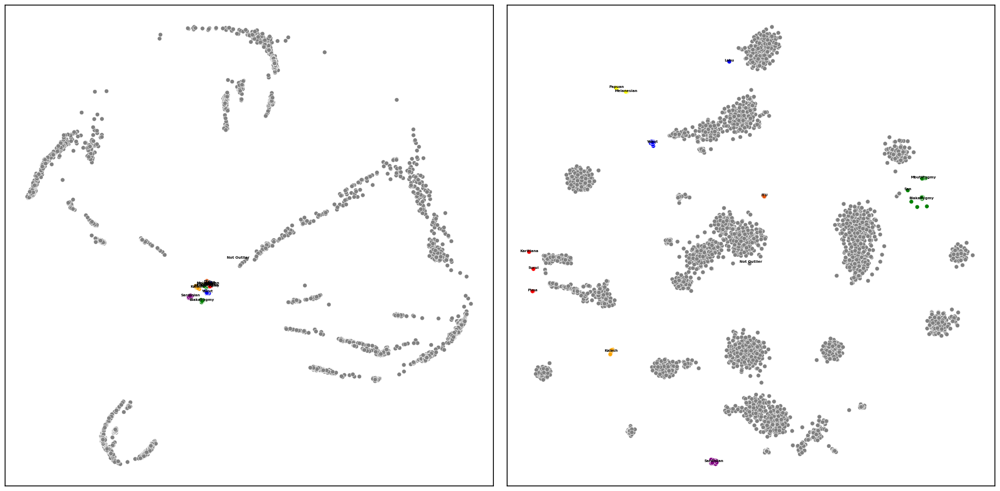

In [34]:
fig, ax = plt.subplots(ncols=2, figsize=(20,10))
plotting.plot_embeddings(phate_emb, 
                         metadata_labels['DBSCAN+Pop'].values, 
                         None,
                         pop_palette_hgdp_outliers,
                         label_order_hgdp_outliers,
                         True,
                         ax[0])
plotting.plot_embeddings(tsne_emb, 
                         metadata_labels['DBSCAN+Pop'].values, 
                         None,
                         pop_palette_hgdp_outliers,
                         label_order_hgdp_outliers,
                         True,
                         ax[1])
plt.tight_layout()

## 3D Phate

In [35]:
phate_operator_3d = phate.PHATE(random_state=42, n_components=3, knn=5, t=10, n_pca=None)
phate_operator_3d.fit(pca_input)
phate_emb_3d = phate_operator_3d.transform()

Running PHATE on 3449 observations and 100 variables.
Calculating graph and diffusion operator...
  Calculating KNN search...
  Calculated KNN search in 0.88 seconds.
  Calculating affinities...
  Calculated affinities in 0.16 seconds.
Calculated graph and diffusion operator in 1.10 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 0.37 seconds.
  Calculating KMeans...
  Calculated KMeans in 6.44 seconds.
Calculated landmark operator in 7.44 seconds.
Calculating diffusion potential...
Calculated diffusion potential in 1.19 seconds.
Calculating metric MDS...


/lustre06/project/6065672/sciclun4/Envs/phate_env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Calculated metric MDS in 15.13 seconds.


In [36]:
import scprep
scprep.plot.rotate_scatter3d(phate_emb_3d, 
                             c=pd.Categorical(metadata_labels['DBSCAN+Pop'].values), 
                             figsize=(8,6),
                             cmap=pop_palette_hgdp_outliers,
                             ticks=False, label_prefix="PHATE",
                             filename='1000G+HGDP_3dPHATE_color_outlier.mp4')

## Check missingness

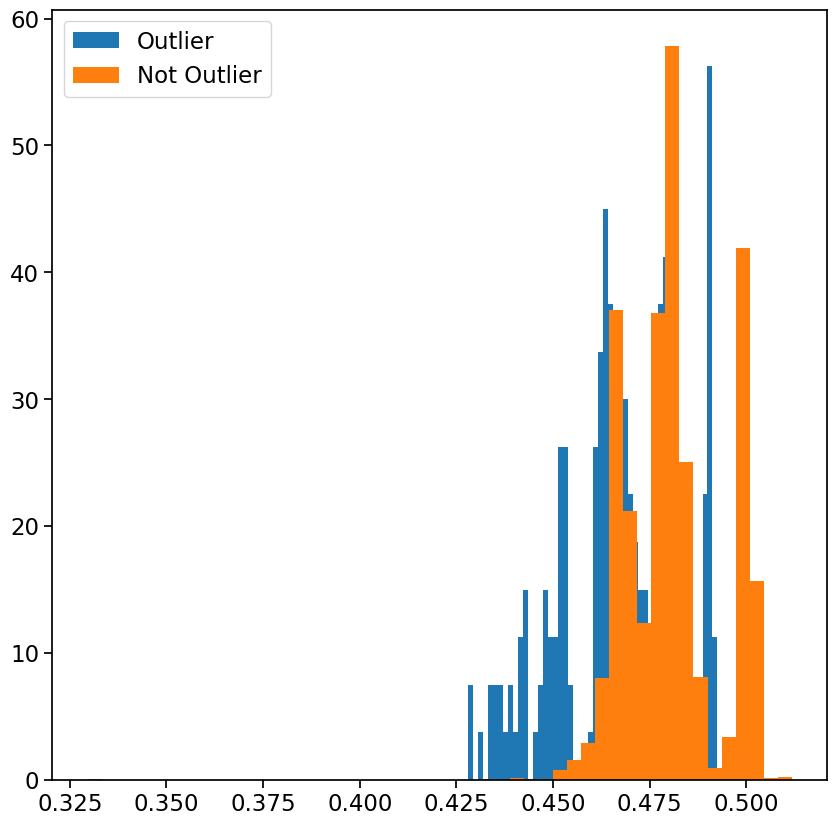

In [35]:
# freq nonzero per sample
fig, ax = plt.subplots(figsize=(10,10))
_ = ax.hist((inputs>0)[metadata_labels['DBSCAN+Pop'] != 'Not Outlier'].mean(1), label='Outlier', density=True, bins=50)
_ = ax.hist((inputs>0)[metadata_labels['DBSCAN+Pop'] == 'Not Outlier'].mean(1), label='Not Outlier', density=True, bins=50)
ax.legend()
# maybe more missing values?

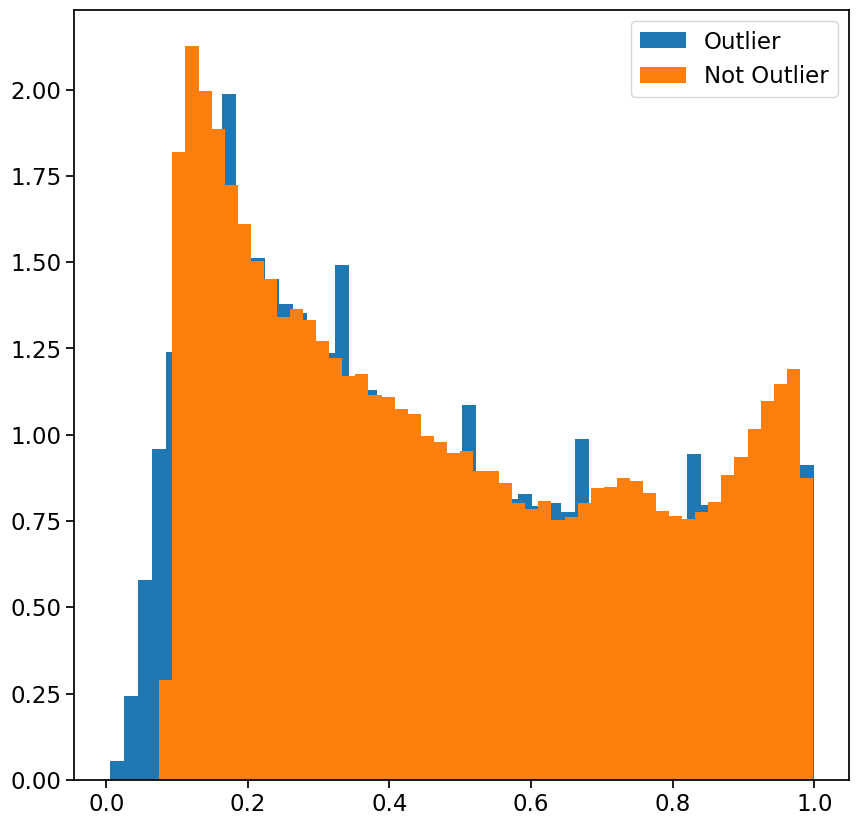

In [36]:
# freq nonzero per sample
fig, ax = plt.subplots(figsize=(10,10))
_ = ax.hist((inputs>0)[metadata_labels['DBSCAN+Pop'] != 'Not Outlier'].mean(0), label='Outlier', density=True,  bins=50)
_ = ax.hist((inputs>0)[metadata_labels['DBSCAN+Pop'] == 'Not Outlier'].mean(0), label='Not Outlier', density=True, bins=50)
ax.legend()
# maybe more missing values?

Look at smallest values

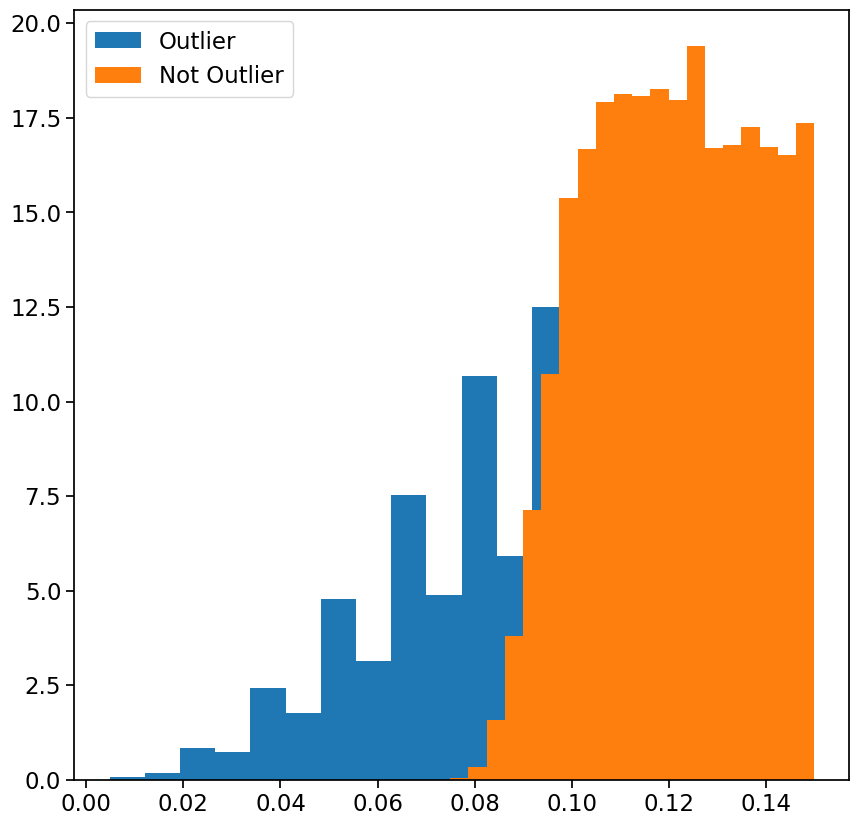

In [37]:
feat_nonzero_notoutlier = (inputs>0)[metadata_labels['DBSCAN+Pop'] == 'Not Outlier'].mean(0)
feat_nonzero_outlier = (inputs>0)[metadata_labels['DBSCAN+Pop'] != 'Not Outlier'].mean(0)

# only keep smallest values
small_notoutlier = feat_nonzero_notoutlier[feat_nonzero_notoutlier < 0.15]
small_outlier = feat_nonzero_outlier[feat_nonzero_outlier < 0.15]

# average input value per position
fig, ax = plt.subplots(figsize=(10,10))
_ = ax.hist(small_outlier, label='Outlier', density=True, bins=20)
_ = ax.hist(small_notoutlier, label='Not Outlier', density=True, bins=20)

ax.legend()

In [38]:
outlier_snp_freq_df = pd.DataFrame({'snp_names': snp_names[(feat_nonzero_outlier < 0.02)],
                                      'freq': (inputs>0).mean(0)[(feat_nonzero_outlier < 0.02)],
                                      'outlier freq': feat_nonzero_outlier[(feat_nonzero_outlier < 0.02)],
                                      'non-outlier freq': feat_nonzero_notoutlier[(feat_nonzero_outlier < 0.02)]})

In [39]:
outlier_snp_freq_df.to_csv('outlier_snp_freq_df')

## Heterozygous and Homozygous Freq

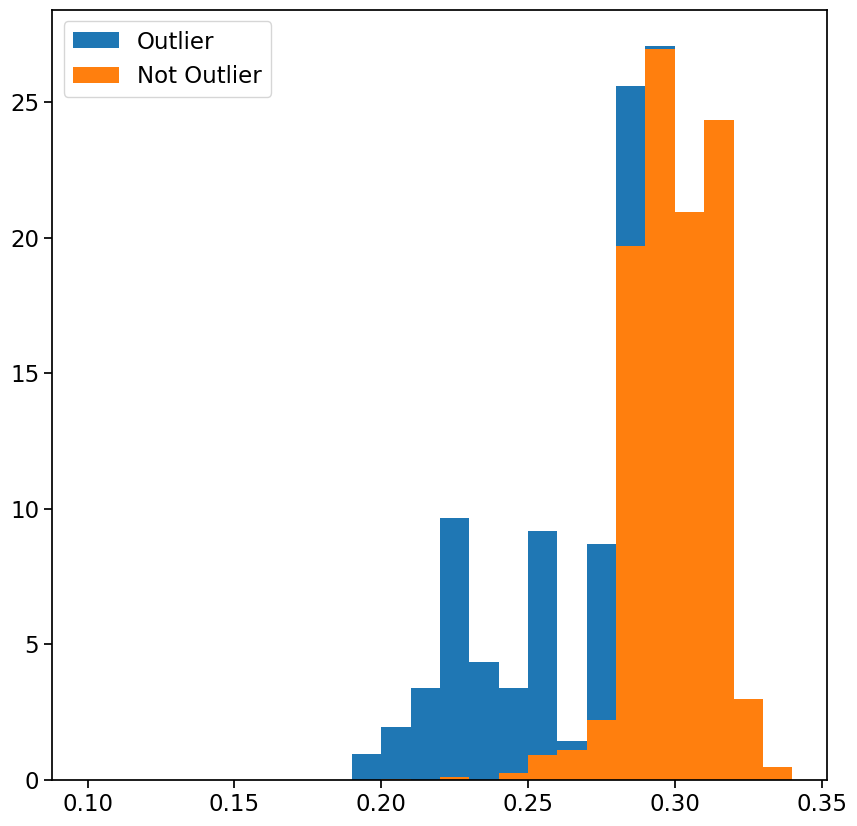

In [ ]:
# heterozygosity 
# freq of heterozygous positions per sample
fig, ax = plt.subplots(figsize=(10,10))
_ = ax.hist((inputs==1)[metadata_labels['DBSCAN+Pop'] != 'Not Outlier'].mean(1), label='Outlier', density=True, bins=np.arange(0.1, 0.35, 0.01))
_ = ax.hist((inputs==1)[metadata_labels['DBSCAN+Pop'] == 'Not Outlier'].mean(1), label='Not Outlier', density=True, bins=np.arange(0.1, 0.35, 0.01))
ax.legend()

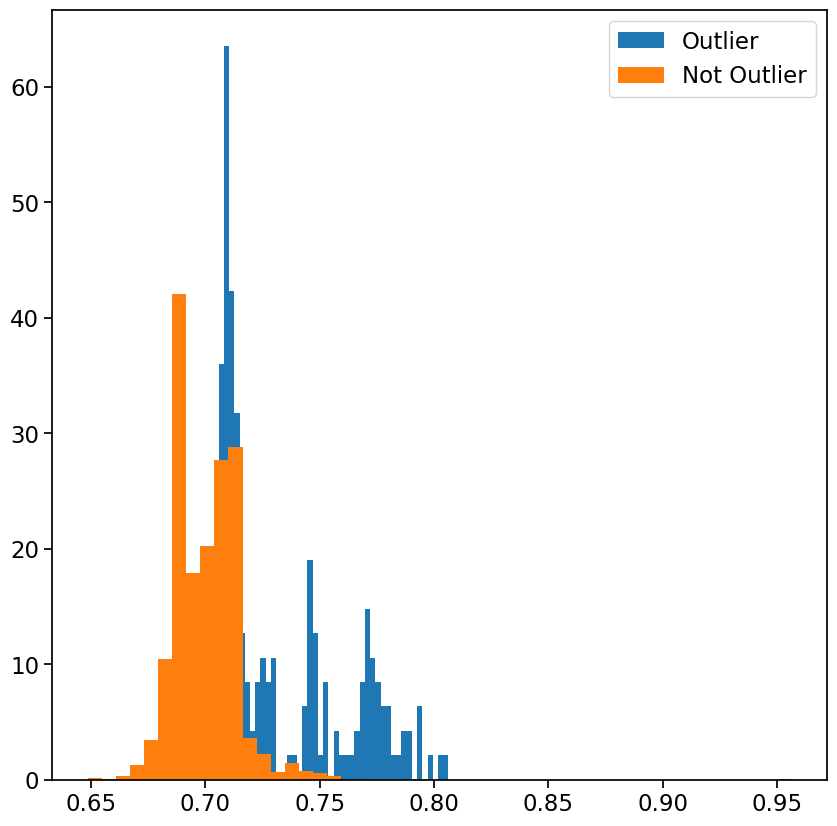

In [45]:
# homozygosity 
# freq of homozygous positions per sample
fig, ax = plt.subplots(figsize=(10,10))
_ = ax.hist((inputs!=1)[metadata_labels['DBSCAN+Pop'] != 'Not Outlier'].mean(1), label='Outlier', density=True, bins=50)
_ = ax.hist((inputs!=1)[metadata_labels['DBSCAN+Pop'] == 'Not Outlier'].mean(1), label='Not Outlier', density=True, bins=50)
ax.legend()

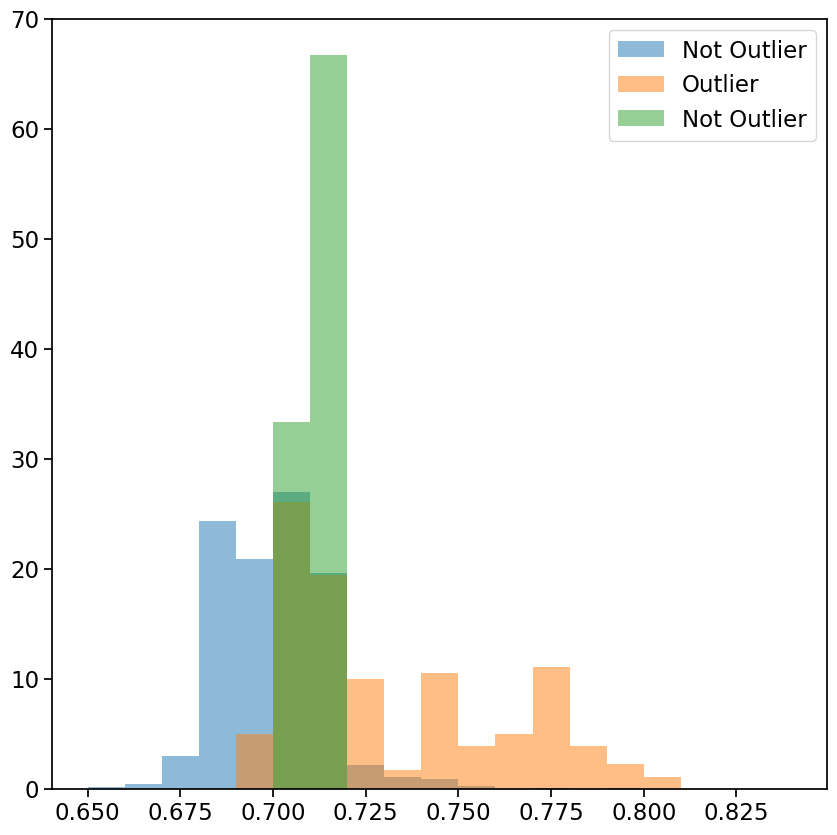

In [54]:
# homozygosity 
# freq of homozygous positions per sample
fig, ax = plt.subplots(figsize=(10,10))
_ = ax.hist((inputs!=1)[(metadata_labels['DBSCAN+Pop'] == 'Not Outlier')].mean(1), label='Not Outlier', density=True, bins=np.arange(0.65, 0.85, 0.01), alpha=0.5)
_ = ax.hist((inputs!=1)[(metadata_labels['DBSCAN+Pop'] != 'Not Outlier') & (metadata_labels['DBSCAN+Pop'] != 'Sardinian')].mean(1), label='Outlier', density=True, bins=np.arange(0.65, 0.85, 0.01), alpha=0.5)
_ = ax.hist((inputs!=1)[metadata_labels['DBSCAN+Pop'] == 'Sardinian'].mean(1), label='Not Outlier', density=True, bins=np.arange(0.65, 0.85, 0.01), alpha=0.5)

ax.legend()

In [47]:
np.unique(metadata_labels['DBSCAN+Pop'])

array(['BiakaPygmy', 'ITU', 'Kalash', 'Karitiana', 'Lahu', 'MbutiPygmy',
       'Melanesian', 'Not Outlier', 'Papuan', 'Pima', 'San', 'Sardinian',
       'Surui', 'Yakut'], dtype=object)